In [ ]:
import cv2

In [ ]:
from skimage import io
from google.colab.patches import cv2_imshow # for image display

In [ ]:
pip uninstall opencv-python-headless==4.5.5.62

Found existing installation: opencv-python-headless 4.5.2.52
Uninstalling opencv-python-headless-4.5.2.52:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless-4.5.2.52.dist-info/*
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavcodec-8daa01ff.so.58.109.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavformat-06a336f2.so.58.61.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libavutil-01d48d95.so.56.60.100
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libbz2-a273e504.so.1.0.6
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libcrypto-098682aa.so.1.1
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libpng15-c2ffaf3d.so.15.13.0
    /usr/local/lib/python3.7/dist-packages/opencv_python_headless.libs/libssl-f3db6a3b.so.1.1
    /usr/local/lib/python3.7/dist-package

In [ ]:
pip install opencv-python-headless==4.5.2.52

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached opencv_python_headless-4.5.2.52-cp37-cp37m-manylinux2014_x86_64.whl (38.2 MB)


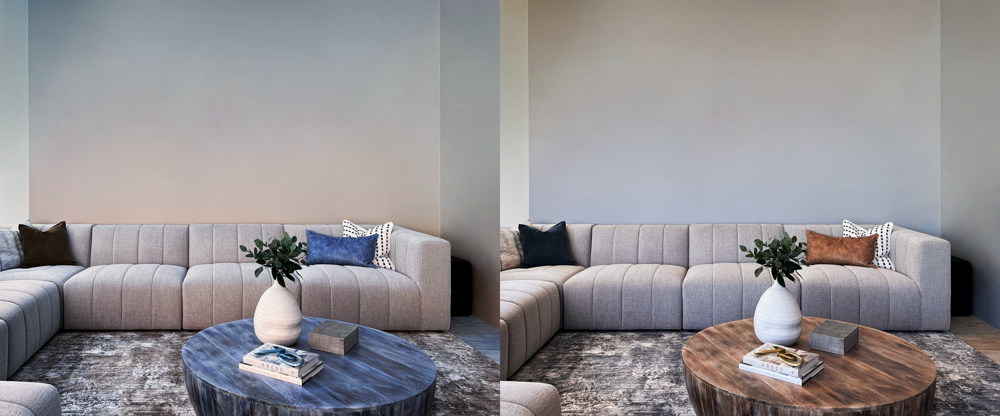

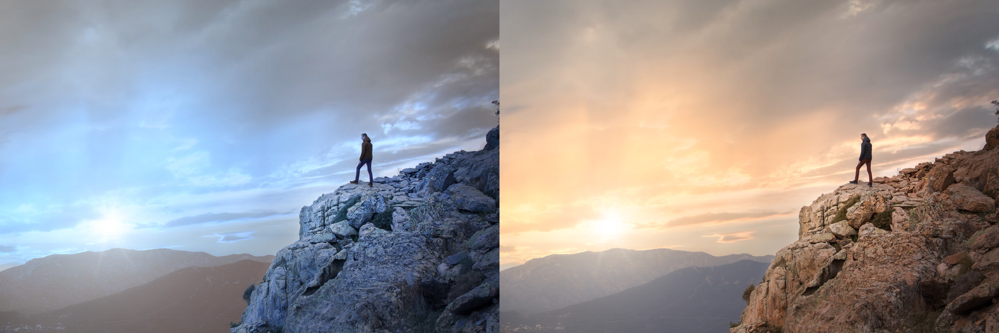

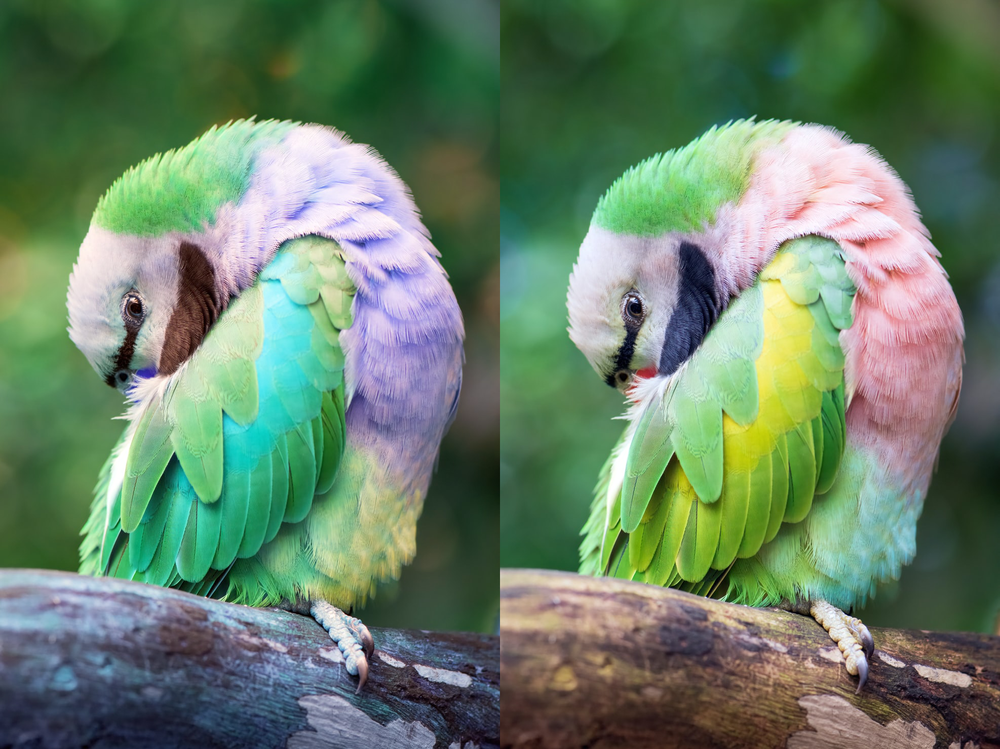

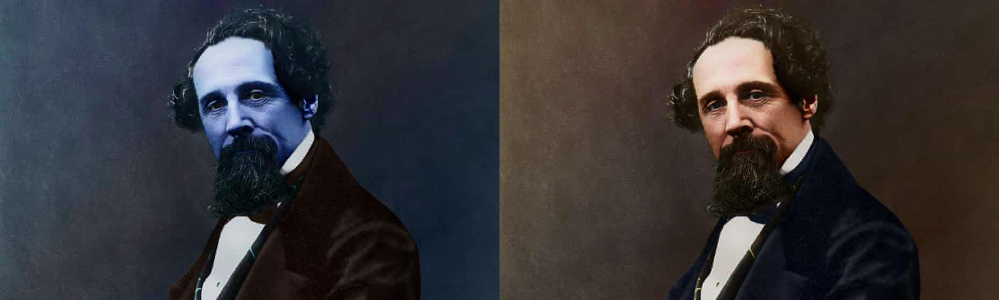

In [ ]:
urls = ["https://images.unsplash.com/photo-1651764126724-5af9b63ec825?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1596&q=80",
       "https://images.unsplash.com/photo-1651693029270-bf3c29ad0b20?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1740&q=80",
      "https://images.unsplash.com/photo-1651666445280-426bae060557?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=987&q=80",
      "https://i.guim.co.uk/img/media/c4c3ed5b82928811b804cc817f77da2e15ea228b/0_372_2400_1440/master/2400.jpg?width=465&quality=45&auto=format&fit=max&dpr=2&s=ced60313f74bd842900905f05a2b4f5e"]  

for url in urls:
  image1 = io.imread(url) 
  image2 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
  result = cv2.hconcat((image1, image2))
  cv2_imshow(result)
  print('\n')

In [ ]:
import matplotlib.pylab as plt

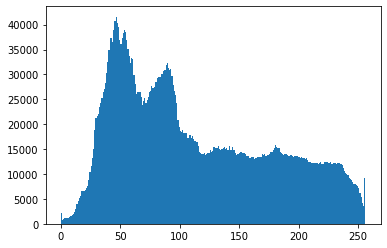

In [ ]:
img = io.imread("https://images.unsplash.com/photo-1651666445280-426bae060557?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=987&q=80") 

plt.hist(img.ravel(),bins = 256, range = [0,256]) 
plt.show()

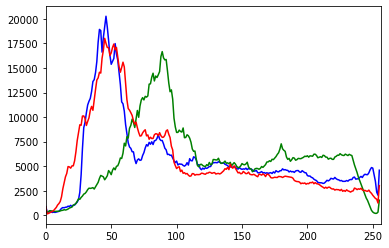

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

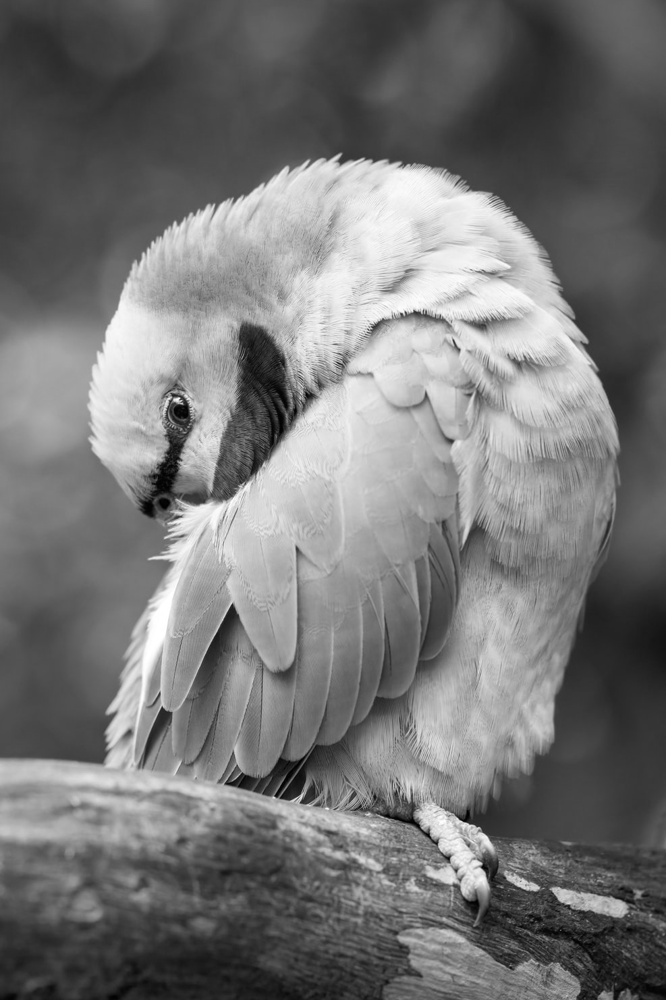

In [ ]:
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_img)

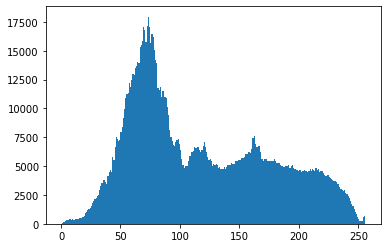

In [ ]:
plt.hist(gray_img.ravel(),bins = 256, range = [0, 256])
plt.show()

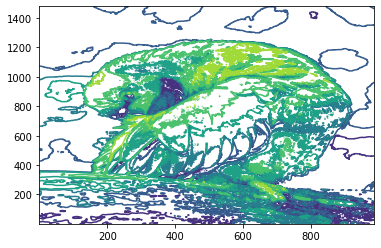

In [ ]:
plt.contour(gray_img, origin = "image")
# contour: https://docs.opencv.org/3.1.0/d4/d73/tutorial_py_contours_begin.html

In [ ]:
gray_img

array([[67, 67, 67, ..., 74, 74, 74],
       [67, 67, 67, ..., 74, 74, 74],
       [67, 67, 67, ..., 74, 74, 74],
       ...,
       [20, 20, 20, ..., 23, 22, 21],
       [17, 17, 17, ..., 26, 25, 24],
       [14, 15, 14, ..., 26, 25, 24]], dtype=uint8)

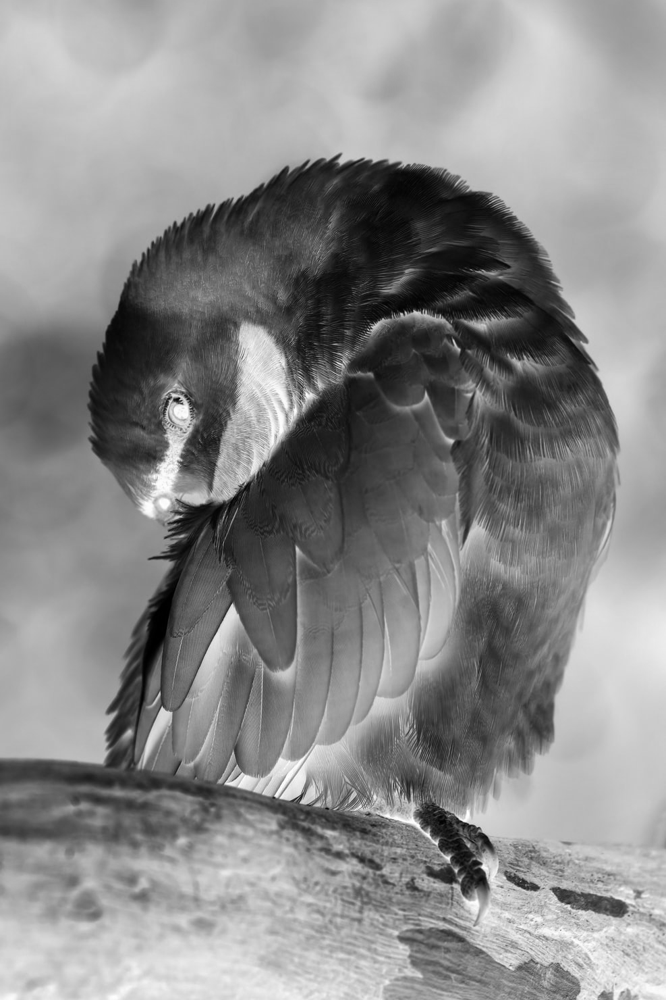

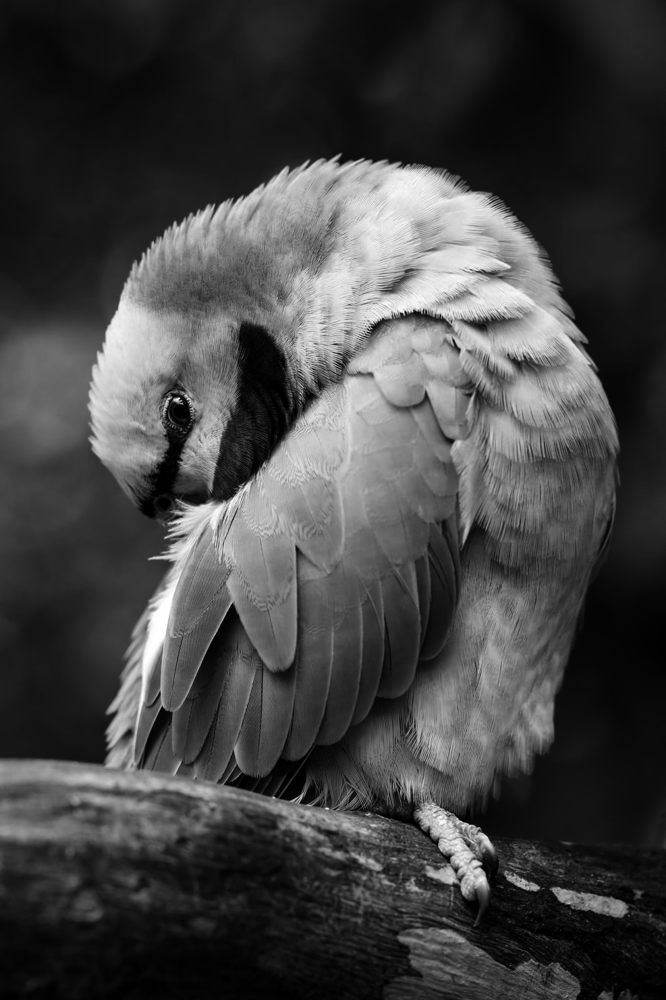

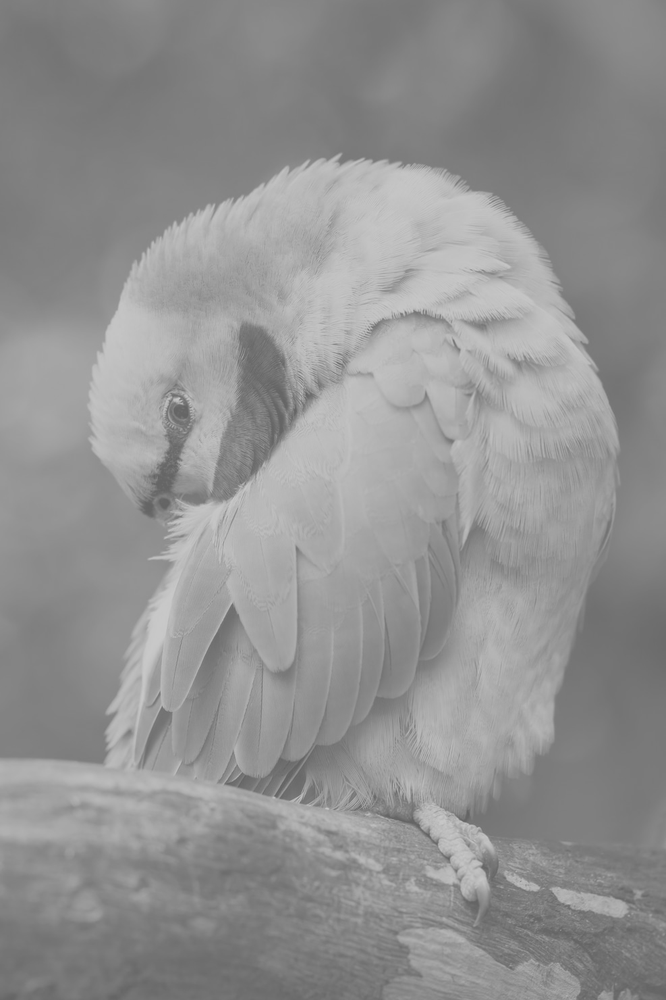

In [ ]:
img2 = 255 - gray_img
img3 = 255.0*(gray_img/255.0)**2
img4 = (100.0/255)*gray_img + 100
cv2_imshow(img2)
cv2_imshow(img3)
cv2_imshow(img4)

In [ ]:
import numpy as np

# We are going to flatten the transformed gray images so that all intensities can be equally common as possible.
def histeq(im, nbr_bins = 256):
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

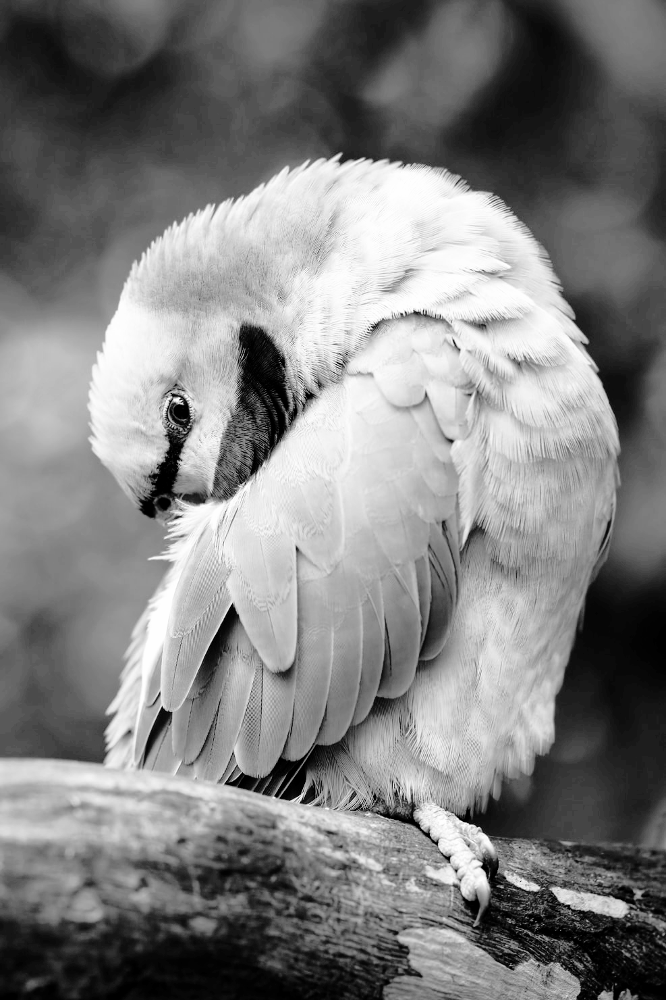

In [ ]:
example = histeq(img3)
cv2_imshow(example)